# SIBUR competition baseline

In [1]:
# Импорт нужных библиотек и настройка глобальных параметров ноутбука
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import hvplot.pandas
import holoviews as hv
import bokeh
import seaborn as sns

from sklearn.metrics import mean_squared_error as MSE

%matplotlib inline
pd.set_option('display.max_columns', 500)
plt.rcParams['figure.figsize'] = (10,3)

targets = ['target', 'target2', 'target3', 'target4', 'target5']

In [2]:
# common functions
def print_learning_curve(history, skip_first=3):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(len(loss))

    plt.plot(epochs[skip_first:], loss[skip_first:], 'bo', label='Training loss')
    plt.plot(epochs[skip_first:], val_loss[skip_first:], 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()
    
def make_prediction(pred, filename='predict.csv'):
    df = pd.DataFrame(pred, index=X_test['2018':].index, columns=['target_pred'])
    df['target_pred'].to_csv(filename, index=True, header=True)

In [3]:
# 1. read raw data
sensors = pd.read_csv('data/sensors.csv', parse_dates=['timestamp'], index_col='timestamp')
coke = pd.read_csv('data/coke_target.csv', parse_dates=['timestamp'], index_col='timestamp')
reactor_pressure = pd.read_csv('data/reactor_pressure_target.csv', parse_dates=['timestamp'], index_col='timestamp')

temp_on_he = pd.read_csv('data/temp_on_he_target.csv', parse_dates=['timestamp'], index_col='timestamp')
pressure_he = pd.read_csv('data/pressure_he_target.csv', parse_dates=['timestamp'], index_col='timestamp')
activity = pd.read_csv('data/activity_target.csv', parse_dates=['timestamp'], index_col='timestamp')

reactor_pressure.columns = ['target2']
temp_on_he.columns = ['target3']
pressure_he.columns = ['target4']
activity.columns = ['target5']

# 2. merge to one dataframe
merged_df = pd.merge(sensors, coke, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, reactor_pressure, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, temp_on_he, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, pressure_he, on='timestamp', how='outer')
merged_df = pd.merge(merged_df, activity, on='timestamp', how='outer')

# 3. split to train and test data
train = merged_df[:'2017-12-31 23:00:00'].fillna(method='ffill').fillna(method='bfill')
X_test = merged_df.drop(targets, axis=1).fillna(method='ffill').dropna()['2018-01-01':]

validation_start_index = len(merged_df[:'2017-11-01 00:00:00'])
test_start_index = len(merged_df[:'2017-11-15 00:00:00'])
prediction_start_index = len(train)

In [4]:
width = 490
height = 200

graph1 = train.f_0.hvplot(width = width, height = height) + train.target3.hvplot(width = width, height = height) + \
        train.target.hvplot(width = width, height = height) + train.target4.hvplot(width = width, height = height) + \
        train.target2.hvplot(width = width, height = height) + train.target5.hvplot(width = width, height = height)
graph1.cols(2)

:Layout
   .Curve.F_0     :Curve   [timestamp]   (f_0)
   .Curve.Target3 :Curve   [timestamp]   (target3)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Target4 :Curve   [timestamp]   (target4)
   .Curve.Target2 :Curve   [timestamp]   (target2)
   .Curve.Target5 :Curve   [timestamp]   (target5)

C:\Progs\Anaconda2\envs\Tensor\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


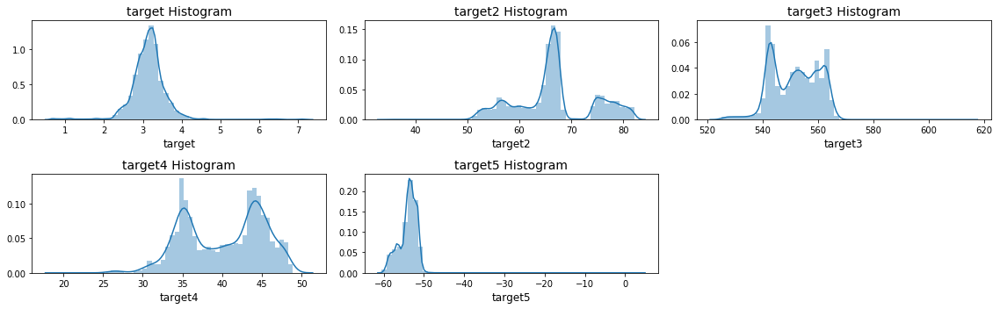

In [5]:
plt.figure(figsize=(16,5))
for i, tar in enumerate(targets):
    sns.distplot(train[tar].values, bins=50, kde=True, ax = plt.subplot(2, 3, i+1))
    plt.xlabel(tar, fontsize=12)
    plt.title(tar + ' Histogram', fontsize=14)

plt.tight_layout()
plt.show()

In [6]:
# basic boosting decision.. poor results witout time-specific features
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=10)
gbr = GradientBoostingRegressor()

X_train = df.drop(targets, axis=1)
y_train = df[targets[0]]
scores=[]
full_prediction = []
for train_ind, test_ind in tscv.split(X_train):
    used_indexes = len(train_ind) + len(test_ind)
    gbr.fit(X_train.iloc[train_ind], y_train.iloc[train_ind])
    pred = gbr.predict(X_train.iloc[test_ind])
    
    # for drawing prediction
    full_prediction.append(np.concatenate([y_train[train_ind], pred, np.zeros(len(X_train) - used_indexes)]))
    
    score = MSE(y_train.iloc[test_ind], pred)**0.5
    scores.append(score)
    print('train len: ', len(train_ind), '\t till ', X_train.index[train_ind[-1]]  ,'\t score: ' , score)

print('average score: ', np.mean(scores))

train len:  954 	 till  2016-12-03 09:00:00 	 score:  0.3802939688525462
train len:  1901 	 till  2017-01-11 20:00:00 	 score:  0.7091185597527654
train len:  2848 	 till  2017-02-20 07:00:00 	 score:  0.47690398041195925
train len:  3795 	 till  2017-03-31 18:00:00 	 score:  0.9991259315473047
train len:  4742 	 till  2017-05-10 05:00:00 	 score:  0.3022290977323031
train len:  5689 	 till  2017-06-18 16:00:00 	 score:  0.37521186389437766
train len:  6636 	 till  2017-07-28 03:00:00 	 score:  0.32463816612843366
train len:  7583 	 till  2017-09-05 14:00:00 	 score:  0.9964271656462586
train len:  8530 	 till  2017-10-15 01:00:00 	 score:  0.3722710769583149
train len:  9477 	 till  2017-11-23 12:00:00 	 score:  0.309565389740923
average score:  0.5245785200665186


In [11]:
# draw prediction - score is lower than simple target.mean()
pred_df = pd.DataFrame(full_prediction[9], index=X_train.index)
pred_df.hvplot() * y_train.hvplot()

:Overlay
   .Curve.I      :Curve   [timestamp]   (0)
   .Curve.Target :Curve   [timestamp]   (target)

In [6]:
# Making a submission file #
make_prediction(pred, 'gru_baseline2.csv')

#0.5562 оценка  RMSE
# 0.5248 - my score

NameError: name 'pred' is not defined

In [112]:
from keras.models import Sequential
from keras.layers import Flatten, Dense, LSTM, GRU
from keras.optimizers import RMSprop
from keras.callbacks import EarlyStopping, TensorBoard
from keras.preprocessing.sequence import TimeseriesGenerator

validation_start_index = len(merged_df[:'2017-09-01 00:00:00'])
test_start_index = len(merged_df[:'2017-10-30 00:00:00'])
prediction_start_index = len(train)

lookback = 30*24
step = 5
delay = 10
batch_size = 120

print('train: \t\t' ,validation_start_index)
print('validation:\t', test_start_index - validation_start_index)
print('test: \t\t', len(X_train) - test_start_index)

train: 		 7473
validation:	 1416
test: 		 1511


In [113]:
X_train = train.drop(targets[1:], axis=1)
y_train = train[targets[0]]

X_test = merged_df.drop(targets[1:], axis=1).fillna(method='ffill').iloc[len(X_train) - lookback:]
y_test = merged_df[targets[0]].fillna(method='ffill').iloc[len(X_train) - lookback:]

val_steps = (len(X_train) - validation_start_index - lookback) // batch_size
test_steps = (len(X_test) - lookback) // batch_size

train_data_gen = TimeseriesGenerator(X_train.values, y_train.values, start_index=0, end_index=validation_start_index,
                               length=lookback, sampling_rate=step, batch_size=batch_size)

val_data_gen = TimeseriesGenerator(X_train.values, y_train.values, start_index=validation_start_index - lookback + 1, 
                                   end_index=test_start_index,
                               length=lookback, sampling_rate=step, batch_size=batch_size)

test_data_gen = TimeseriesGenerator(X_train.values, y_train.values, start_index=test_start_index - lookback + 1, 
                                   end_index=None,
                               length=lookback, sampling_rate=step, batch_size=batch_size)

submission_data_gen = TimeseriesGenerator(X_test.values, y_test.values, start_index=0, 
                                   end_index=None,
                               length=lookback, sampling_rate=step, batch_size=batch_size)

In [114]:
callbacks_list = [EarlyStopping(monitor='val_loss', patience=2),
                 #TensorBoard(log_dir='my_log_dir', histogram_freq=1, embeddings_freq=1)
                 ]

model = Sequential()
#model.add(Flatten(input_shape=(train_data_gen[0][0][0].shape))) #lookback // step, X_train.shape[-1])))
model.add(GRU(16, dropout=0.2, recurrent_dropout=0.5, return_sequences=True, input_shape=(train_data_gen[0][0][0].shape)))
model.add(GRU(32, dropout=0.1, activation='relu', recurrent_dropout=0.5, return_sequences=True))
model.add(GRU(16, dropout=0.2, recurrent_dropout=0.5))
#model.add(Dense(32, activation='relu'))
model.add(Dense(1))
model.compile(optimizer=RMSprop(), loss='mae')

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_23 (GRU)                 (None, 144, 16)           3168      
_________________________________________________________________
gru_24 (GRU)                 (None, 144, 32)           4704      
_________________________________________________________________
gru_25 (GRU)                 (None, 16)                2352      
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 17        
Total params: 10,241
Trainable params: 10,241
Non-trainable params: 0
_________________________________________________________________


Epoch 1/20
40/40 [==============================] - 13s 329ms/step - loss: 1.8428 - val_loss: 0.6283
Epoch 2/20
40/40 [==============================] - 9s 226ms/step - loss: 0.5483 - val_loss: 0.4824
Epoch 3/20
40/40 [==============================] - 9s 222ms/step - loss: 0.4553 - val_loss: 0.5067
Epoch 4/20
40/40 [==============================] - 9s 221ms/step - loss: 0.3615 - val_loss: 0.3878
Epoch 5/20
40/40 [==============================] - 9s 225ms/step - loss: 0.3695 - val_loss: 0.5048
Epoch 6/20
40/40 [==============================] - 9s 220ms/step - loss: 0.3507 - val_loss: 0.3863
Epoch 7/20
40/40 [==============================] - 9s 222ms/step - loss: 0.3334 - val_loss: 0.5358
Epoch 8/20
40/40 [==============================] - 9s 219ms/step - loss: 0.3673 - val_loss: 0.3770
Epoch 9/20
40/40 [==============================] - 9s 223ms/step - loss: 0.3653 - val_loss: 0.4996
Epoch 10/20
40/40 [==============================] - 9s 225ms/step - loss: 0.3234 - val_loss: 0.379

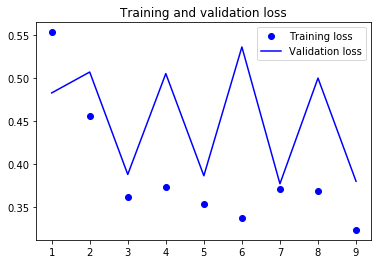

In [115]:
history = model.fit_generator(train_data_gen, steps_per_epoch=40, epochs=20, validation_data=val_data_gen, 
                              validation_steps=val_steps, callbacks=callbacks_list)

print_learning_curve(history, skip_first=1)

In [116]:
pred = model.predict_generator(submission_data_gen)
pred_df = pd.DataFrame(pred, index=X_test['2018':].index)
pred_df.hvplot()

#make_prediction(pred, 'gru_baseline.csv')

:Curve   [timestamp]   (0)

In [117]:
test_pred = model.predict_generator(val_data_gen)
test_df = pd.DataFrame(test_pred, index=X_train.iloc[validation_start_index: test_start_index].index, columns=['prediction'])
test_df['target'] = X_train.iloc[validation_start_index: test_start_index].target
print('validation length', len(test_pred))
test_df.hvplot()

validation length 1416


:NdOverlay   [Variable]
   :Curve   [timestamp]   (value)

In [118]:
test_pred = model.predict_generator(test_data_gen)
test_df = pd.DataFrame(test_pred, index=X_train.iloc[test_start_index+1:].index, columns=['prediction'])
test_df['target'] = X_train.iloc[test_start_index+1:].target
print('test length', len(test_pred))
test_df.hvplot()

test length 1510


:NdOverlay   [Variable]
   :Curve   [timestamp]   (value)

In [20]:
graph1 = merged_df.f_25.hvplot(width = width, height = height) + merged_df.f_26.hvplot(width = width, height = height) + \
        train.target.hvplot(width = width, height = height) + train.target2.hvplot(width = width, height = height) + \
        merged_df.f_46.hvplot(width = width, height = height) + merged_df.f_47.hvplot(width = width, height = height)
graph1.cols(2)

:Layout
   .Curve.F_25    :Curve   [timestamp]   (f_25)
   .Curve.F_26    :Curve   [timestamp]   (f_26)
   .Curve.Target  :Curve   [timestamp]   (target)
   .Curve.Target2 :Curve   [timestamp]   (target2)
   .Curve.F_46    :Curve   [timestamp]   (f_46)
   .Curve.F_47    :Curve   [timestamp]   (f_47)